In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline
import plotly.express as px
import category_encoders as ce

import requests
from pprint import pprint
import re

# Natural Language Toolkit
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import f_classif

# import the necessary libraries for model
from sklearn.ensemble import RandomForestRegressor # tool to build and train the model
from sklearn import metrics # tools to evaluate model accuracy
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
# fixing RANDOM_SEED
RANDOM_SEED = 42

In [3]:
!pip freeze > requirements.txt

In [4]:
# data reading 

# DATA_DIR = '/kaggle/input/sf-booking/'
DATA_DIR = '.'
df_train = pd.read_csv(DATA_DIR+'/hotels_train.csv') 
df_test = pd.read_csv(DATA_DIR+'/hotels_test.csv') 
sample_submission = pd.read_csv(DATA_DIR+'/submission.csv') 

## **Exploring data**

In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386803 entries, 0 to 386802
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               386803 non-null  object 
 1   additional_number_of_scoring                386803 non-null  int64  
 2   review_date                                 386803 non-null  object 
 3   average_score                               386803 non-null  float64
 4   hotel_name                                  386803 non-null  object 
 5   reviewer_nationality                        386803 non-null  object 
 6   negative_review                             386803 non-null  object 
 7   review_total_negative_word_counts           386803 non-null  int64  
 8   total_number_of_reviews                     386803 non-null  int64  
 9   positive_review                             386803 non-null  object 
 

In [6]:
df_train.head(2)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng
0,Stratton Street Mayfair Westminster Borough Lo...,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,51.507894,-0.143671
1,130 134 Southampton Row Camden London WC1B 5AF...,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,51.521009,-0.123097


In [7]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128935 entries, 0 to 128934
Data columns (total 16 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               128935 non-null  object 
 1   additional_number_of_scoring                128935 non-null  int64  
 2   review_date                                 128935 non-null  object 
 3   average_score                               128935 non-null  float64
 4   hotel_name                                  128935 non-null  object 
 5   reviewer_nationality                        128935 non-null  object 
 6   negative_review                             128935 non-null  object 
 7   review_total_negative_word_counts           128935 non-null  int64  
 8   total_number_of_reviews                     128935 non-null  int64  
 9   positive_review                             128935 non-null  object 
 

In [8]:
df_test.head(2)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,tags,days_since_review,lat,lng
0,Via Senigallia 6 20161 Milan Italy,904,7/21/2017,8.1,Hotel Da Vinci,United Kingdom,Would have appreciated a shop in the hotel th...,52,16670,Hotel was great clean friendly staff free bre...,62,1,"[' Leisure trip ', ' Couple ', ' Double Room '...",13 days,45.533137,9.171102
1,Arlandaweg 10 Westpoort 1043 EW Amsterdam Neth...,612,12/12/2016,8.6,Urban Lodge Hotel,Belgium,No tissue paper box was present at the room,10,5018,No Positive,0,7,"[' Leisure trip ', ' Group ', ' Triple Room ',...",234 day,52.385649,4.834443


In [9]:
sample_submission.head(2)

,reviewer_score,id
0,8.793,488440
1,7.406,274649


In [10]:
sample_submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128935 entries, 0 to 128934
Data columns (total 2 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   reviewer_score  128935 non-null  float64
 1   id              128935 non-null  int64  
dtypes: float64(1), int64(1)
memory usage: 2.0 MB


In [11]:
# for correct processing of features, we combine the train and the test into one dfset
df_train['sample'] = 1 # mark train
df_test['sample'] = 0 # mark test
df_test['reviewer_score'] = 0 # 0 for reviewer_score in test dfset

df = df_test.append(df_train, sort=False).reset_index(drop=True)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   review_date                                 515738 non-null  object 
 3   average_score                               515738 non-null  float64
 4   hotel_name                                  515738 non-null  object 
 5   reviewer_nationality                        515738 non-null  object 
 6   negative_review                             515738 non-null  object 
 7   review_total_negative_word_counts           515738 non-null  int64  
 8   total_number_of_reviews                     515738 non-null  int64  
 9   positive_review                             515738 non-null  object 
 

## **Data cleansing**

In [13]:
df.nunique().sort_values(ascending=False)

positive_review                               412601
negative_review                               330011
tags                                           55242
hotel_address                                   1493
hotel_name                                      1492
lat                                             1472
lng                                             1472
total_number_of_reviews                         1142
review_date                                      731
days_since_review                                731
additional_number_of_scoring                     480
review_total_negative_word_counts                402
review_total_positive_word_counts                365
reviewer_nationality                             227
total_number_of_reviews_reviewer_has_given       198
reviewer_score                                    38
average_score                                     34
sample                                             2
dtype: int64

Features with a high number of unique values adversely affect the performance of the model. The most unique features are objects. Let's see what valuable information we can get out and delete them, if necessary. 

In [14]:
# Dropping low information columns 
# with 99% unique values or 99% of identical values.

def low_information(data):
    """Low information search.
    Function to search and delete low information columns 
    with 99% unique values or 99% of identical values.

    Args:
        data (DataFrame): DataFrame for analysis.

    Returns:
        DataFrame: DataFrame without low information columns.
    """
    
    print('*** Searching low information columns ***\n')
        
    low_information_cols = [] 
    
    # searching low information columns
    for col in data.columns:
        top_freq = data[col].value_counts(normalize=True).max()
        nunique_ratio = data[col].nunique() / data[col].count()
        
        if top_freq > 0.99:
            low_information_cols.append(col)
            print(f'{col}: {round(top_freq*100, 2)}% identical values')
        if nunique_ratio > 0.99:
            low_information_cols.append(col)
            print(f'Dropped: {col} with {round(nunique_ratio*100, 2)}% unique values')
    
    # dropping low information column if detected
        
    if len(low_information_cols) == 0:
        print('No low information columns detected')
    else:
        data = data.drop(low_information_cols, axis=1)
        
    return data


low_information(df);

*** Searching low information columns ***

No low information columns detected


In [15]:
# Marking duplicates
def mark_duplicates(data):
    """Marking duplicates.
    Creating a new feature with marked duplicates.
    
    Args:
        data (DataFrame): DataFrame for analysis.
    Returns:
        DataFrame: DataFrame with marked duplicates.
    """
    print('*** Marking duplicates ***',
            '\nEntries: {}'.format(data.shape[0]))
    list1 = list(data.columns)
        
    duplicates = data[data.duplicated(subset=list1)]
    
    # marking duplicates
    data['duplicated'] = data.duplicated(subset=list1)
    
    # or dropping duplicates
    # df = df.drop_duplicates()

    print('Count of duplicates: {}'.format(duplicates.shape[0]))
     
    return data

mark_duplicates(df);

*** Marking duplicates *** 
Entries: 515738
Count of duplicates: 336


lng                                           3268
lat                                           3268
hotel_address                                    0
review_total_positive_word_counts                0
reviewer_score                                   0
sample                                           0
days_since_review                                0
tags                                             0
total_number_of_reviews_reviewer_has_given       0
positive_review                                  0
additional_number_of_scoring                     0
total_number_of_reviews                          0
review_total_negative_word_counts                0
negative_review                                  0
reviewer_nationality                             0
hotel_name                                       0
average_score                                    0
review_date                                      0
duplicated                                       0
dtype: int64


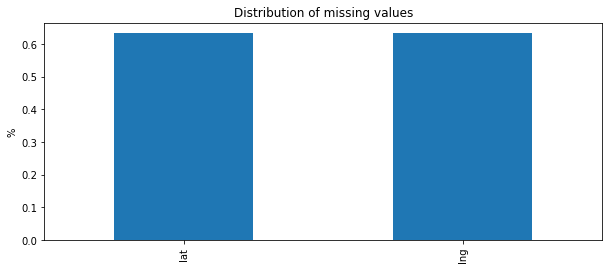

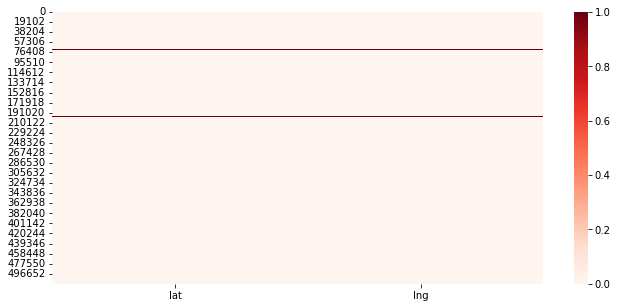

In [16]:
# Processing Null values

def null_values(data):
    """Null values detection.
    Detect missing values for DataFrame,
    visualizing them on barplot and heatmap.
    
    Args:
        data (DataFrame): DataFrame for analysis.
    Returns:
        DataFrame: DataFrame with cleaned missing values.
    """
    if df.isnull().sum().sum() == 0:
        print('*** No missing values in DataFrame ***')
        
    else:
        print(data.isnull().sum().sort_values(ascending=False))
        
        cols_null_percent = data.isnull().mean() * 100
        cols_with_null = cols_null_percent[cols_null_percent>0].sort_values(ascending=False)

        # building barplot
        cols_with_null.plot(
            kind='bar',
            figsize=(10, 4),
            title='Distribution of missing values',
            ylabel ='%'
        )

        # building heatmap
        fig = plt.figure(figsize=(11, 5))
        cols = cols_with_null.index
        ax = sns.heatmap(
            data[cols].isnull(),
            cmap='Reds'
        );
    
    return(data)

null_values(df);

In [17]:
# Replacing missing values of latitude and longitude with 0 value
df['lat'] = df['lat'].fillna(0)
df['lng'] = df['lng'].fillna(0)

null_values(df);

*** No missing values in DataFrame ***


**Target feature - reviewer_score**

In [18]:
# Distribution visualization

def distribution_fig(data, column):
    """Building histogram for distribution visualization.

    Args:
        data (DataFrame):  DataFrame for visualization.
        column (str): feature for visualization.

    Returns:
        fig: histogram for distribution 
    """
    
    # building histogram
    fig = px.histogram(
        data_frame=data,
        x=column,
        title='',
        width=600,
        height=400,
        marginal='box'
    )
    fig.update_layout(title='Distribution of {}'.format(column))
    
    return fig.show()

In [19]:
# Building a distribution plot for reviewer_score for training data only
distribution_fig(df[df['sample'] == 1], 'reviewer_score')

In [20]:
def outliers_iqr_mod(data, feature, left=1.5, right=1.5, log_scale=False):
    """IQR outliers search.
    Finding outliers using the interquartile range (Tukey's range test) 

    Args:
        data (DataFrame): DataFrame for analysis.
        feature (str): numeric column to analyse.
        left (float, optional),  
        right (float, optional): IQRs  the left and right borders.
                                    Defaults to 1.5.
        log_scale (bool, optional): parameter of using logarithmic scale in search.  
                                    Default to False.
    Returns:
        outliers (DataFrame): Outliers
        cleaned  (DataFrame): Cleaned data without outliers.
    """
    
    if log_scale:
        x = np.log(data[feature])
    else:
        x = data[feature]

    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75),
    iqr = quartile_3 - quartile_1
    lower_bound = quartile_1 - (iqr * left)
    upper_bound = quartile_3 + (iqr * right)
    outliers = data[(x<lower_bound) | (x > upper_bound)]
    cleaned = data[(x>lower_bound) & (x < upper_bound)]
    
    print(f'Count Tukey\'s range outliers for {feature}: {outliers.shape[0]}')
    print(f'Records without outliers for {feature}: {cleaned.shape[0]}')

    return outliers, cleaned

In [21]:
# Searching for interquartile range outliers of reviewer_score feature for training data
outliers_iqr, cleaned_iqr = outliers_iqr_mod(df[df['sample'] == 1], 'reviewer_score')
# or
# outliers_iqr, cleaned_iqr = outliers_iqr_mod(df[df['sample'] == 1], 'reviewer_score', log_scale=True)

# Marking outliers for reviewer_score
df.loc[outliers_iqr.index, 'outliers'] = True

# or Continueing with cleaned data
# df = df.drop(index=outliers_iqr.index, axis=0)

# Visualization of cleaned reviewer_score with the interquartile range (Tukey's range test) 
distribution_fig(cleaned_iqr, 'reviewer_score')


Count Tukey's range outliers for reviewer_score: 11908
Records without outliers for reviewer_score: 374895


In [22]:
def outliers_z_score_mod(data, feature, log_scale=False, left=3, right=3):
    """Z-score outliers search.
        Finding outliers using the Z-score. 

    Args:
        data (DataFrame): DataFrame for analysis.
        feature (str): numeric column to analyse.
        log_scale (bool, optional): parameter of using logarithmic scale in search.  
                                Default to False.
        left (float, optional),  
        right (float, optional): IQRs  the left and right borders.
                            Defaults to 3.
    Returns:
        outliers (DataFrame): outliers
        cleaned  (DataFrame): Cleaned data without outliers.
    """
    
    if log_scale:
        x = np.log(data[feature])
    else:
        x = data[feature]        

    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]

    print(f'Count Z-score outliers for {feature}: {outliers.shape[0]}')
    print(f'Records without outliers for {feature}: {cleaned.shape[0]}')

    return outliers, cleaned


In [23]:
# Searching for interquartile range outliers of reviewer_score feature for training data
# outliers_z, cleaned_z = outliers_z_score_mod(df[df['sample'] == 1], 'reviewer_score')

# or
outliers_z, cleaned_z = outliers_z_score_mod(df[df['sample'] == 1], 'reviewer_score', log_scale=True)

# Marking outliers for reviewer_score
df.loc[outliers_z.index, 'outliers'] = True

# or continuing with cleaned data
# df = df.drop(index=outliers_z.index, axis=0)

# Visualization of cleaned reviewer_score with the z-score
distribution_fig(cleaned_z, 'reviewer_score')


Count Z-score outliers for reviewer_score: 8081
Records without outliers for reviewer_score: 378722


In [24]:
# marking not outliers as False
df['outliers'] = df['outliers'].notnull()
df['outliers'].value_counts()

False    503830
True      11908
Name: outliers, dtype: int64

# **Exploratory Data Analysis**

## **Feature Engineering**

**hotel_address feature**

In [25]:
# getting countries information by using request library 

url = 'https://restcountries.com/v3.1/all'
response = requests.get(url)
countries = response.json()

# checking available information
pprint(countries)

[{'altSpellings': ['BB'],
  'area': 430.0,
  'capital': ['Bridgetown'],
  'capitalInfo': {'latlng': [13.1, -59.62]},
  'car': {'side': 'left', 'signs': ['BDS']},
  'cca2': 'BB',
  'cca3': 'BRB',
  'ccn3': '052',
  'cioc': 'BAR',
  'coatOfArms': {'png': 'https://mainfacts.com/media/images/coats_of_arms/bb.png',
                 'svg': 'https://mainfacts.com/media/images/coats_of_arms/bb.svg'},
  'continents': ['North America'],
  'currencies': {'BBD': {'name': 'Barbadian dollar', 'symbol': '$'}},
  'demonyms': {'eng': {'f': 'Barbadian', 'm': 'Barbadian'},
               'fra': {'f': 'Barbadienne', 'm': 'Barbadien'}},
  'fifa': 'BRB',
  'flag': '🇧🇧',
  'flags': {'png': 'https://flagcdn.com/w320/bb.png',
            'svg': 'https://flagcdn.com/bb.svg'},
  'idd': {'root': '+1', 'suffixes': ['246']},
  'independent': True,
  'landlocked': False,
  'languages': {'eng': 'English'},
  'latlng': [13.16666666, -59.53333333],
  'maps': {'googleMaps': 'https://goo.gl/maps/2m36v8STvbGAWd9c7',
     

In [26]:
# creating DataFrame countries_df with useful information

code_list = []
name_list = []
region_list = []
capital_list = []

for e in countries:
    code_list.append(e['cca2'])
    name_list.append(e['name']['common'])
    region_list.append(e['region'])

    try:
        capital_list.append(''.join(e['capital']))
    except KeyError:
        capital_list.append('No capital')

countries_df = pd.DataFrame({
    'code':code_list,
    'name':name_list,
    'region':region_list,
    'capital':capital_list
})

display(countries_df)

# list for quick checks
counties_list = countries_df['name'].to_list()

,code,name,region,capital
0,BB,Barbados,Americas,Bridgetown
1,IO,British Indian Ocean Territory,Africa,Diego Garcia
2,CG,Republic of the Congo,Africa,Brazzaville
3,BR,Brazil,Americas,Brasília
4,LU,Luxembourg,Europe,Luxembourg
...,...,...,...,...
245,HR,Croatia,Europe,Zagreb
246,NU,Niue,Oceania,Alofi
247,AI,Anguilla,Americas,The Valley
248,QA,Qatar,Asia,Doha


In [27]:
def get_countries(address):
    """Countries of hotels.
    Last word in hotel's adress usually  is a country of hotel.
    Except countries with two words in the name.
    Function split address string and check the country name in 
    countries dataset, that we have by API.

    Args:
        address (str): address string

    Returns:
        str: country name or np.NaN, 
        if function could not found one.
    """
    # split address to list 
    address_list = address.split(' ')
    
    # check country name as last word or last 2 words    
    if address_list[-1].strip() in counties_list:
        return address_list[-1]
    elif ' '.join(address_list[-2:]).strip() in counties_list:
        return ' '.join(address_list[-2:]).strip()
    else:
        return np.NaN

    
df['country'] = df['hotel_address'].apply(get_countries)
df['country'].value_counts()

United Kingdom    262301
Spain              60149
France             59928
Netherlands        57214
Austria            38939
Italy              37207
Name: country, dtype: int64

In [28]:
# for easier appearance let's change country name by cca2 code

common_country = {}

def country_to_code(country):
    """Getting cca2 code of country.
        Searching cca2 code by country name in countries_df
        or in common_country dictionary for faster proccess.
    Args:
        country (str): country common name

    Returns:
        code (str): country cca2 code
    """
    global common_country
    
    if country in common_country.keys():
        code = common_country[country]
    else:
        code = countries_df[countries_df['name'] == country]['code'].iloc[0]
        common_country[country] = code
    
    return code


# applying function to replace country name by cca2 code
df['country'] = df['country'].apply(country_to_code)
df['country'].value_counts()


GB    262301
ES     60149
FR     59928
NL     57214
AT     38939
IT     37207
Name: country, dtype: int64

In [29]:
# getting cities information by using request library 

url = 'https://countriesnow.space/api/v0.1/countries/population/cities'
response = requests.get(url)
cities = response.json()

# creating dictionaty with city population
city_population = dict()
for c in cities['data'][:-2]:
    city_population[c['city'].title()] = c['populationCounts'][0]['value']
    
# creating list with cities of 1 million population and more    
city_pop_mil = []
for k, v in city_population.items():
    city_pop_mil.append(k) if float(v)> 1e6-1 else None


In [30]:
def capital_feature(address):
    """Capital city fearure.
    Function analize the hotel_address and
    check if a city is capital.

    Args:
        address (str): address string

    Returns:
        int: 1 if city is capital or 0.
    """
    capital = 0
    capital_list = countries_df['capital'].to_list()
    address_list = address.split(' ')
    
    for w in address_list:
        if w in capital_list:
            capital = 1
        else:
            continue
    
    return capital

In [31]:
def city_mil_feature(address):
    """Over million population city fearure.
    Function analize the hotel_address and
    check 1 if a city of 1 million population and more.

    Args:
        address (str): address string

    Returns:
        int:  1 if a city of 1 million population and more or 0.
    """
    
    city_mil = 0
    address_list = address.split(' ')
    
    for w in address_list:
        if w in city_pop_mil:
            city_mil = 1
        else:
            continue

    return  city_mil


# creating feature for hotels in capital and in city of 1 million population and more 

df['capital'] = df['hotel_address'].apply(capital_feature)
df['city_mil'] = df['hotel_address'].apply(city_mil_feature)

# checking the features
df.loc[:, ['hotel_address','capital','city_mil']]

,hotel_address,capital,city_mil
0,Via Senigallia 6 20161 Milan Italy,0,0
1,Arlandaweg 10 Westpoort 1043 EW Amsterdam Neth...,1,0
2,Mallorca 251 Eixample 08008 Barcelona Spain,0,1
3,Piazza Della Repubblica 17 Central Station 201...,0,0
4,Singel 303 309 Amsterdam City Center 1012 WJ A...,1,0
...,...,...,...
515733,9 Knaresborough Place Kensington and Chelsea L...,1,1
515734,Landstra er Hauptstra e 155 03 Landstra e 1030...,1,0
515735,29 31 Gower Street Camden London WC1E 6HG Unit...,1,1
515736,31 Great Cumberland Place Westminster Borough ...,1,1


In [32]:
# let's see how much entries don't correspond any of new feature of city
mask = (df['capital']==0) & (df['city_mil']==0)
display(df.loc[mask, ['hotel_address','capital','city_mil']])

,hotel_address,capital,city_mil
0,Via Senigallia 6 20161 Milan Italy,0,0
3,Piazza Della Repubblica 17 Central Station 201...,0,0
10,Via Giorgio Stephenson 55 20157 Milan Italy,0,0
14,Via Napo Torriani 24 Central Station 20124 Mil...,0,0
72,Piazza Gerusalemme 6 Sempione 20154 Milan Italy,0,0
...,...,...,...
515650,Via Pietro Gaggia 3 Ripamonti Corvetto 20139 M...,0,0
515674,Via della Giustizia 10 D Bicocca Zara 20125 Mi...,0,0
515676,Via Senigallia 6 20161 Milan Italy,0,0
515701,Via Privata Leopoldo Gasparotto 8 Central Stat...,0,0


In [33]:
# We can see that Milan is not in list with cities of 1 million population.
print('Milan is in list:','Milan' in city_pop_mil)

# Probably, the reason that Milan represented in italian 
print('Milano is in list:','Milano' in city_pop_mil)

Milan is in list: False
Milano is in list: True


In [34]:
# let's add 'Milan', as it have population of over 3 million.
city_pop_mil.append('Milan')

# deleting feature and creating it again with new list
df.drop(['city_mil'],
        axis=1,
        inplace=True)

df['city_mil'] = df['hotel_address'].apply(city_mil_feature)

display(df.loc[mask, ['hotel_address','capital','city_mil']])

,hotel_address,capital,city_mil
0,Via Senigallia 6 20161 Milan Italy,0,1
3,Piazza Della Repubblica 17 Central Station 201...,0,1
10,Via Giorgio Stephenson 55 20157 Milan Italy,0,1
14,Via Napo Torriani 24 Central Station 20124 Mil...,0,1
72,Piazza Gerusalemme 6 Sempione 20154 Milan Italy,0,1
...,...,...,...
515650,Via Pietro Gaggia 3 Ripamonti Corvetto 20139 M...,0,1
515674,Via della Giustizia 10 D Bicocca Zara 20125 Mi...,0,1
515676,Via Senigallia 6 20161 Milan Italy,0,1
515701,Via Privata Leopoldo Gasparotto 8 Central Stat...,0,1


**review_date feature**

In [35]:
# converting review_date to datetime object
df['review_date'] = pd.to_datetime(df['review_date'])

print('Reviews are published from {1} till {0}'.format(
    df['review_date'].max().date(), df['review_date'].min().date()))

Reviews are published from 2015-08-04 till 2017-08-03


In [36]:
# creating feature of review's season of the year
def get_season(date):
    """Get a season of the year for reviews.
    

    Args:
        date (datetime): review date 

    Returns:
        str: one of seasons winter, spring, summer or autumn
    """
    # seasons
    winter = [ 1, 2, 12]
    spring = [3, 4, 5]
    summer =[6, 7, 8]
    autumn  = [9, 10, 11]
    
    # check the month of review
    if date.month in winter: return 'winter'
    if date.month in spring: return 'spring'
    if date.month in summer: return 'summer'
    if date.month in autumn: return 'autumn'

df['review_season'] = df['review_date'].apply(get_season)
df['review_season'].value_counts()

summer    142886
spring    130483
autumn    122241
winter    120128
Name: review_season, dtype: int64

In [37]:
# creaitng feature of reviews done on weekends
df['review_on_weekend'] = df['review_date'].apply(
    lambda x: 1 if x.dayofweek > 4 else 0)

In [38]:
# creaitng feature of the month when review have been published
df['review_month'] = df['review_date'].apply(lambda x: x.month)

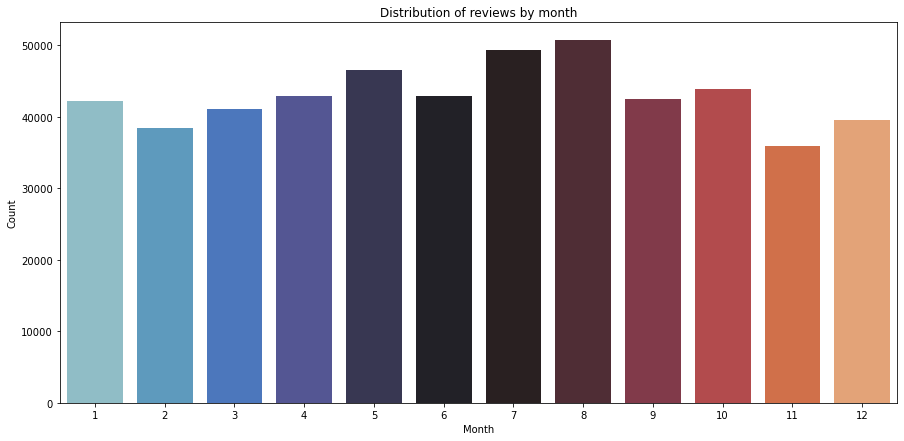

In [39]:
# distribution of reviews by month
pivot_review = pd.pivot_table(
    data=df,
    index='review_month', 
    values='reviewer_score', 
    aggfunc=['count'])

fig, ax = plt.subplots(figsize=(15, 7))

sns.barplot(
    x=pivot_review.index,
    y=pivot_review[('count', 'reviewer_score')],
    palette='icefire')

ax.set_xlabel('Month')
ax.set_ylabel('Count')
ax.set_title('Distribution of reviews by month')
fig.show('png');

**reviewer_nationality**

In [40]:
# removing spaces at the beginning and at the end of the string features

def strip_values(data):
    """
    Function to search spaces at the beginning and at the end of the string.
    Stripping (removing) them.

     Args:
        data (DataFrame): DataFrame for analysis.
    Returns:
        DataFrame: DataFrame with removed spaces in string columns.
    """
    
    # creating a set of columns to strip
    spaced_set = set()
    
    # detecting unstriped string columns in 7 randomly chosen values
    for col in data.select_dtypes(include='object'):
        for i in range(0, 7):
            num = np.random.randint(1, data.shape[0])
            if data.iloc[num][col] !=data.iloc[num][col].strip():
                spaced_set.add(col)
            else:
                continue
            
    # removing spaces in detected columns
    for i in spaced_set:
        data[i] = data[i].apply(lambda x: x.strip()) 
    print('Extra spaces removed from columns:', *spaced_set, sep='\n')
    
    return data

strip_values(df);

Extra spaces removed from columns:
negative_review
positive_review
reviewer_nationality


In [41]:
# reviewer_nationality is added by user and can have errors 
# let's check if there are entries that differ to countries names

fail_list = set()
ok_list =set()
for s in df['reviewer_nationality']:
    if s in counties_list:
        ok_list.add(s)
        continue
    else:
        fail_list.add(s)
        continue
        
print('***Wrong entries in reviewer_nationality***\n',
      'Count: {}\nValues:\n{}'.format(len(fail_list), fail_list))

***Wrong entries in reviewer_nationality***
 Count: 25
Values:
{'', 'Congo', 'Crimea', 'U S Virgin Islands', 'Bonaire St Eustatius and Saba', 'East Timor', 'Reunion', 'St Pierre and Miquelon', 'Antigua Barbuda', 'Saint Barts', 'Turks Caicos Islands', 'Palestinian Territory', 'Abkhazia Georgia', 'Democratic Republic of the Congo', 'Saint Vincent Grenadines', 'Cura ao', 'United States of America', 'Swaziland', 'Macedonia', 'Central Africa Republic', 'Falkland Islands Malvinas', 'Czech Republic', 'Svalbard Jan Mayen', 'St Maarten', 'Cocos K I'}


In [42]:
# check empty values in reviewer_nationality
print('Empty values in reviewer_nationality:', 
      df[df['reviewer_nationality'] == ''].shape[0])

# let's change it to 'Not specified'
df.loc[df['reviewer_nationality'] == '', 'reviewer_nationality'] = 'Not specified'

# to avoid errors in country_to_code, let's add 'Not specified'
# key to common_country with abbreviation NS
common_country['Not specified'] = 'NS'

Empty values in reviewer_nationality: 523


In [43]:
# as much i like automatization, in this case fastest solution is manual 

fix_country = {'Abkhazia Georgia':'Georgia',
 'Antigua Barbuda':'Antigua and Barbuda',
 'Bonaire St Eustatius and Saba':'Caribbean Netherlands',
 'Central Africa Republic':'Central African Republic',
 'Cocos K I':'Cocos (Keeling) Islands',
 'Congo':'DR Congo',
 'Crimea':'Ukraine',
 'Cura ao':'Curaçao',
 'Czech Republic':'Czechia',
 'Democratic Republic of the Congo':'DR Congo',
 'East Timor':'Timor-Leste',
 'Falkland Islands Malvinas':'Falkland Islands',
 'Macedonia':'North Macedonia',
 'Palestinian Territory':'Palestine',
 'Reunion':'France',
 'Saint Barts':'Saint Barthélemy',
 'Saint Vincent Grenadines':'Saint Vincent and the Grenadines',
 'St Maarten':'Saint Martin',
 'St Pierre and Miquelon':'Saint Pierre and Miquelon',
 'Svalbard Jan Mayen':'Svalbard and Jan Mayen',
 'Swaziland':'Eswatini',
 'Turks Caicos Islands':'Turks and Caicos Islands',
 'U S Virgin Islands':'United States Virgin Islands',
 'United States of America':'United States'}

# changing wrong contries
for k, v in fix_country.items():
    mask_nat = df['reviewer_nationality'] == k
    df.loc[mask_nat, 'reviewer_nationality'] = v

In [44]:
# let see in a total number of reviews in different countries

grouped_df = df.groupby(['reviewer_nationality'], 
                        as_index=False)['total_number_of_reviews_reviewer_has_given'].sum()
# grouped_df = df.groupby(['reviewer_nationality'], as_index=False).count()

fig = px.choropleth(
    data_frame=grouped_df,
    locations='reviewer_nationality',
    locationmode='country names',
    color='total_number_of_reviews_reviewer_has_given',
    hover_name='reviewer_nationality',
    # scope='europe',
    projection='natural earth',
    color_continuous_scale='Viridis_r',
    # range_color=(0, 100),
    height=500,
    width=1000
)
fig.update_layout(
    title='Total number of reviews in different countries', 
    coloraxis_colorbar_x=-0.1,
    coloraxis_colorbar_title=('Count')
)
fig.show(renderer='notebook');
# fig.show()

In [45]:
# let see in a number of reviews in our dataset

grouped_df = df.groupby(['reviewer_nationality'], 
                        as_index=False)['total_number_of_reviews_reviewer_has_given'].count()
# grouped_df = df.groupby(['reviewer_nationality'], as_index=False).count()

fig = px.choropleth(
    data_frame=grouped_df,
    locations='reviewer_nationality',
    locationmode='country names',
    color='total_number_of_reviews_reviewer_has_given',
    hover_name='reviewer_nationality',
    # scope='europe',
    projection='natural earth',
    color_continuous_scale='Viridis_r',
    # range_color=(0, 100),
    height=500,
    width=1000
)
fig.update_layout(
    title='A number of reviews in our dataset', 
    coloraxis_colorbar_x=-0.1,
    coloraxis_colorbar_title=('Count')
)
fig.show(renderer='notebook');
# fig.show()

In [46]:
# applying function to replace country name by cca2 code

df['reviewer_nationality'] = df['reviewer_nationality'].apply(country_to_code)
df['reviewer_nationality'].value_counts()

GB    245246
US     35437
AU     21686
IE     14827
AE     10235
       ...  
CV         1
VA         1
SJ         1
MP         1
PW         1
Name: reviewer_nationality, Length: 222, dtype: int64

In [47]:
# creation new feature if reviewer is from same country as hotel

df['same_country'] = df.apply(lambda x: 1 if x.reviewer_nationality == x.country else 0, axis=1)
df['same_country'].value_counts()


0    337332
1    178406
Name: same_country, dtype: int64

### **Reviews features**

In [48]:
# for easier representation converting reviews to lowercase
df['negative_review'] = df['negative_review'].str.lower() 
df['positive_review'] = df['positive_review'].str.lower()

**Sentiment features**

In [49]:
# creating sentiment features for reviews by using Natural Language Toolkit
sent_analyzer = SentimentIntensityAnalyzer()

df['positive_review_score'] = df['positive_review'].apply(lambda x: sent_analyzer.polarity_scores(x)['compound'])
df['negative_review_score'] = df['negative_review'].apply(lambda x: sent_analyzer.polarity_scores(x)['compound'])

**negative_review**

<AxesSubplot:>

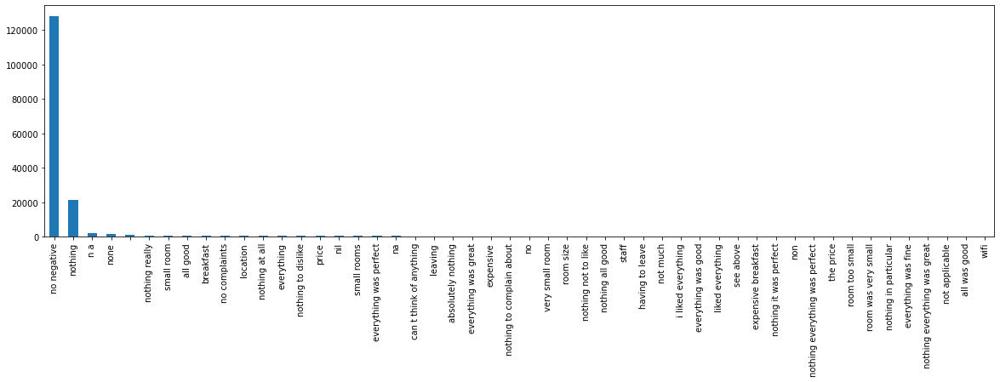

In [50]:
# let's check most common negative reviews
mask_50 = df['negative_review'].value_counts() > 50
df['negative_review'].value_counts()[mask_50].head(50).plot.bar(figsize = (20, 5))

In [51]:
# the most of comments are positive,
# like 'no negative', 'nothing', 'na', 'none'...
# let's find some more
set_of_positive = set(['n a', 'none', '', 'nil', 'na', 'no', 'non'])

# creating list of the most common negative reviews
negative_review_list = df['negative_review'].value_counts().index.to_list()

# checking list of the most common negative reviews if there are positive reviews
for review in negative_review_list:
    
    review_list = review.split(' ')
    
    if len(review_list) < 100:
   
        list_positive1 = ['nothing', 'anything', 'liked']
        for p in list_positive1:
            if p in review_list:
                set_of_positive.add(review)
            else:
                continue            
        list_positive2 = ['negative', 'complaints' , 'specified' ,'applicable']       
        for o in list_positive2:
            if ('not' in review_list 
                or 'no' in review_list) and o in review_list:
                set_of_positive.add(review)
            else:
                continue        
        list_positive3 = ['fine', 'good', 'perfect', 'great']
        for s in list_positive3:
            if ('not' not in review_list 
                and 'wasn' not in review_list
                and 'wasnt' not in review_list) and s in review_list:
                set_of_positive.add(review)
            else:
                continue  
    else:
        continue

# checking set of positive reviews
print(len(set_of_positive))

# nothing special isn't positive
set_of_positive.remove('nothing special')

28295


In [52]:
# creating new feature for hotels without negative reviews
df['no_negative'] = df['negative_review'].apply(lambda x: 1 if x in set_of_positive else 0)
df['no_negative'].value_counts()

0    322713
1    193025
Name: no_negative, dtype: int64

In [53]:
# changing all negative reviews on positive and setting review_total_negative_word_counts to 0
df['negative_review'] = df['negative_review'].apply(lambda x: 'positive' if x in set_of_positive else x)
df.loc[df['no_negative'] == 1, 'review_total_negative_word_counts'] = 0


In [54]:
# the most common negative review
df['negative_review'].value_counts().head(1)

positive    193025
Name: negative_review, dtype: int64

<AxesSubplot:>

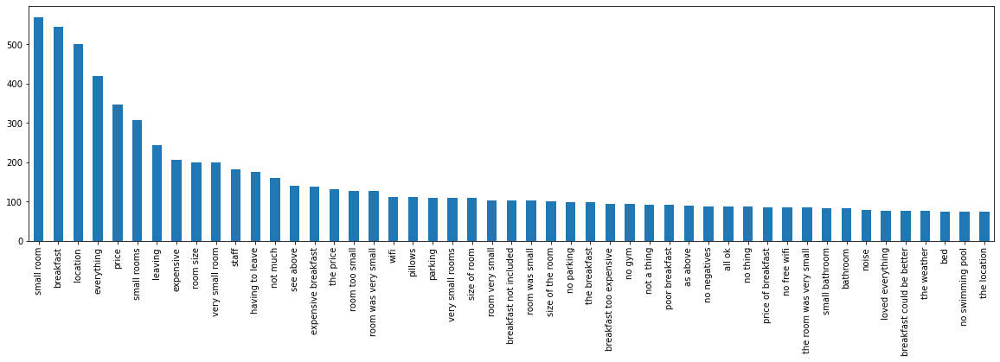

In [55]:
# let's check after cleaning most common negative reviews
# without the most common negative review, as it is positive
mask_50 = df['negative_review'].value_counts() > 50
df['negative_review'].value_counts()[mask_50].iloc[1:50].plot.bar(figsize = (20, 5))

In [56]:
# most common words
def find_common(data, feature, exception='', word_len=3):
    """Search of the most common words in string.
        Printing 50 most common words and build a bar plot.

    Args:
        data (DataFrame): dataset to analyze.
        feature (str): feature to analyze.
        exception (str): entry in feature not to use in function. 
                            Defaults to blank.
        word_len (int, optional): length of words to use in function.
                            Defaults to 3.

    Returns:
        common_words_df (Dataframe): all words in feature. 
    """
    
    # check for TypeError, if feature is not string type
    try:
        words = ' '.join(data[feature].to_list()).split(' ')
    except TypeError:
        
        return print('TypeError: Feature must be a string type')
    
    else:
        # DataFrame with all words in feature
        common_words_df = pd.DataFrame({
            'words':words
        })
        # counting values for words with exception and length more then word_len
        mask_len = common_words_df['words'].str.len() > word_len
        mask_pos = common_words_df['words'] != exception
        word_counts = common_words_df.loc[
            mask_pos & mask_len, 
            'words'
            ].value_counts().sort_values(ascending=False).head(50)   
        
        print('*** Most common words ***:\n', 
            word_counts.index.to_list())
        
        #visualizing most common words on barplot
        fig = px.bar(
            word_counts,
            title='Most common words in reviews',
            width=900,
            labels={'value':'Count',
                    'index':'Words'}
            )
        fig.update_layout(showlegend=False)
        fig.show('png');
        
    return common_words_df  

*** Most common words ***:
 ['room', 'very', 'hotel', 'were', 'breakfast', 'that', 'with', 'have', 'small', 'there', 'they', 'from', 'staff', 'this', 'rooms', 'could', 'when', 'would', 'only', 'bathroom', 'which', 'didn', 'night', 'little', 'shower', 'like', 'more', 'been', 'service', 'time', 'reception', 'expensive', 'poor', 'also', 'stay', 'some', 'check', 'just', 'even', 'floor', 'price', 'water', 'wasn', 'noisy', 'really', 'after', 'work', 'wifi', 'door', 'good']


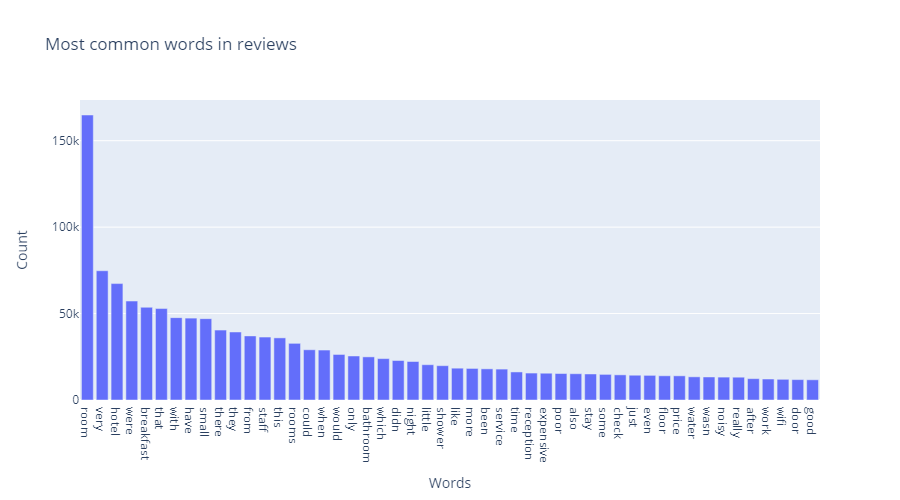

In [57]:
find_common(df, 'negative_review', exception='positive');

In [58]:
# creating feature of small room
df['small_room'] = df['negative_review'].apply(lambda x: True if ('small' in x.split(' ') and 'room' in x.split(' ')) else False)
df['small_room'] = df['small_room'] + df['negative_review'].apply(lambda x: True if ('small' in x.split(' ') and 'rooms' in x.split(' ')) else False)

**positive_review**

<AxesSubplot:>

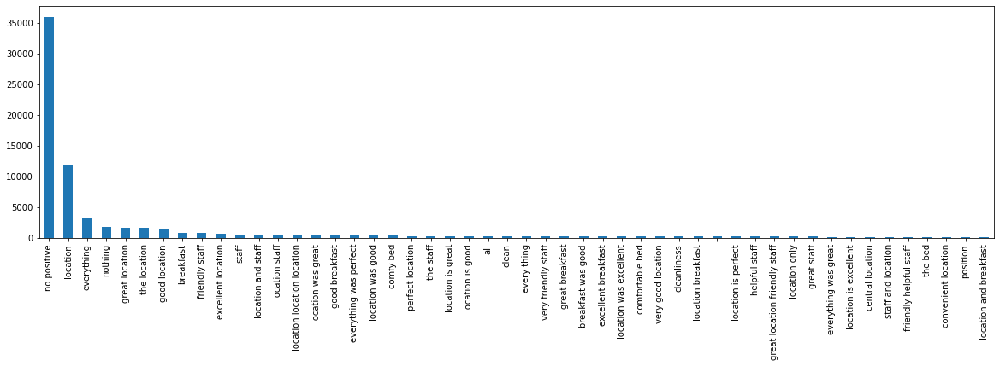

In [59]:
# let's check most common positive reviews
mask_50 = df['positive_review'].value_counts() > 50
df['positive_review'].value_counts()[mask_50].head(50).plot.bar(figsize = (20, 5))

In [60]:
# creating new feature for hotels without positive reviews
df['no_positive'] = df['positive_review'].apply(lambda x: 1 if x == 'no positive' else 0)
df['no_positive'].value_counts()

0    479792
1     35946
Name: no_positive, dtype: int64

In [61]:
# setting review_total_positive_word_counts to 0
df.loc[df['no_positive'] == 1, 'review_total_positive_word_counts'] = 0

In [62]:
# fixing 'total_number_of_reviews'
df['total_number_of_reviews'] = (df['review_total_negative_word_counts'] 
                                 + df['review_total_positive_word_counts'])

*** Most common words ***:
 ['staff', 'location', 'very', 'room', 'hotel', 'good', 'great', 'were', 'friendly', 'breakfast', 'helpful', 'nice', 'clean', 'with', 'excellent', 'comfortable', 'from', 'rooms', 'positive', 'lovely', 'stay', 'close', 'station', 'really', 'this', 'everything', 'perfect', 'service', 'well', 'quiet', 'amazing', 'comfy', 'there', 'walk', 'that', 'have', 'they', 'would', 'also', 'which', 'bathroom', 'view', 'modern', 'london', 'just', 'food', 'metro', 'fantastic', 'reception', 'free']


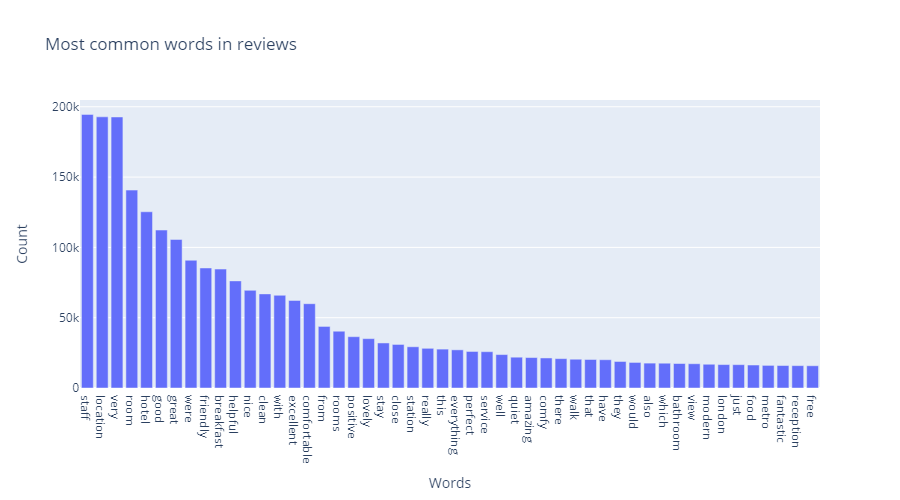

In [63]:
# let's check find common words in positive reviews
find_common(df, 'positive_review', exception='no positive');

In [64]:
# creating features with some TOP words
df['good_staff'] = df['positive_review'].apply(lambda x: 1 if ('staff' in x.split(' '))  else 0)
df['good_location'] = df['positive_review'].apply(lambda x: 1 if ('location' in x.split(' '))  else 0)
df['good_room'] = df['positive_review'].apply(lambda x: 1 if ('room' in x.split(' '))  else 0)
df['good_hotel'] = df['positive_review'].apply(lambda x: 1 if ('hotel' in x.split(' '))  else 0)
df['very_good'] = df['positive_review'].apply(lambda x: 1 if ('very' in x.split(' ') 
                                                              or 'great' in x.split(' ')
                                                              or 'excellent' in x.split(' '))  else 0)


**days_since_review**

In [65]:
df['days_since_review']

0         13 days
1         234 day
2         616 day
3         656 day
4         444 day
           ...   
515733    106 day
515734    171 day
515735    543 day
515736    74 days
515737    363 day
Name: days_since_review, Length: 515738, dtype: object

In [66]:
# converting feature into integer number
df['days_since_review'] = df['days_since_review'].apply(lambda x: int(x.split(' ')[0]))

### **tags feature**

In [67]:
df['tags']

0         [' Leisure trip ', ' Couple ', ' Double Room '...
1         [' Leisure trip ', ' Group ', ' Triple Room ',...
2         [' Business trip ', ' Solo traveler ', ' Twin ...
3         [' Leisure trip ', ' Couple ', ' Ambassador Ju...
4         [' Business trip ', ' Solo traveler ', ' Class...
                                ...                        
515733    [' Leisure trip ', ' Group ', ' Club Double or...
515734    [' Leisure trip ', ' Couple ', ' Standard Doub...
515735    [' Business trip ', ' Solo traveler ', ' Singl...
515736    [' Leisure trip ', ' Solo traveler ', ' Deluxe...
515737    [' Leisure trip ', ' Couple ', ' Bunk Bed Room...
Name: tags, Length: 515738, dtype: object

In [68]:
print('Type of tags feature:\n', type(df['tags'].iloc[0]))

Type of tags feature:
 <class 'str'>


In [69]:
# tags feature is a list-like string 
# for better representation and analysis let's transform it into the list

def list_trans(arg):
    """Tag transformation into list.
    Transformating list-like str tag into list. 

    Args:
        arg (object): list-like str

    Returns:
        new_list (list): list
    """
    
    new_list = []
    temp_list = arg.strip('[]').split(',')

    for i in temp_list:
        new_list.append(i.lower().strip('\' '))
        
    return new_list
        
# applying function
df['tags'] = df['tags'].apply(list_trans)

df['tags']

0         [leisure trip, couple, double room, stayed 2 n...
1         [leisure trip, group, triple room, stayed 1 ni...
2         [business trip, solo traveler, twin room, stay...
3         [leisure trip, couple, ambassador junior suite...
4         [business trip, solo traveler, classic double ...
                                ...                        
515733    [leisure trip, group, club double or twin room...
515734    [leisure trip, couple, standard double room, s...
515735    [business trip, solo traveler, single room, st...
515736    [leisure trip, solo traveler, deluxe double ro...
515737    [leisure trip, couple, bunk bed room, stayed 4...
Name: tags, Length: 515738, dtype: object

In [70]:
# the top value's count of amount of tags
df['tags'].apply(len).value_counts()

5    297823
4    211564
3      5505
6       755
2        85
1         6
Name: tags, dtype: int64

In [71]:
# checking count of unique tags
tags_list = []
for i in df['tags']:
    tags_list.extend(i)
print(len(set(tags_list)), 
      ' unique tags represented in the dataset')

2421  unique tags represented in the dataset


In [72]:
# creating DataFrame for easier analysis of tags
tags_df = pd.DataFrame({'tags':tags_list})
tags_df.value_counts().head(10)

tags                          
leisure trip                      417778
submitted from a mobile device    307640
couple                            252294
stayed 1 night                    193645
stayed 2 nights                   133937
solo traveler                     108545
stayed 3 nights                    95821
business trip                      82939
group                              65392
family with young children         61015
dtype: int64

<AxesSubplot:xlabel='tags'>

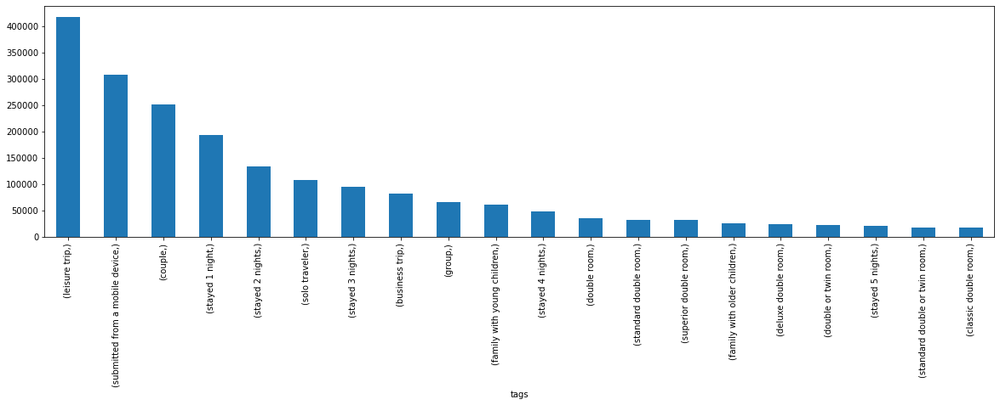

In [73]:
# barplot of most popular tags
tags_df.value_counts().head(20).plot.bar(figsize = (20, 5))

In [74]:
# tags with amount of nights stayed in hotel
nights_tags = set(tags_df['tags'].apply(
    lambda x: x if ('night' in x.split(' ') 
                    or 'nights' in x.split(' ')) else None).to_list())
nights_tags

{None,
 'junior suite give me the night',
 'special offer double room 3 nights minimum',
 'stayed 1 night',
 'stayed 10 nights',
 'stayed 11 nights',
 'stayed 12 nights',
 'stayed 13 nights',
 'stayed 14 nights',
 'stayed 15 nights',
 'stayed 16 nights',
 'stayed 17 nights',
 'stayed 18 nights',
 'stayed 19 nights',
 'stayed 2 nights',
 'stayed 20 nights',
 'stayed 21 nights',
 'stayed 22 nights',
 'stayed 23 nights',
 'stayed 24 nights',
 'stayed 25 nights',
 'stayed 26 nights',
 'stayed 27 nights',
 'stayed 28 nights',
 'stayed 29 nights',
 'stayed 3 nights',
 'stayed 30 nights',
 'stayed 31 nights',
 'stayed 4 nights',
 'stayed 5 nights',
 'stayed 6 nights',
 'stayed 7 nights',
 'stayed 8 nights',
 'stayed 9 nights'}

In [75]:
# creating count of nights feature
nights_tags.discard(None)
nights_tags.discard('junior suite give me the night')

def get_nights(tags):
    """Gitting number of nights.
    A simple function to find number of nights by using regex.

    Args:
        tags (str): all tags.

    Returns:
        num (int): number of nights.
    """
    num = 0
    for t in tags:
        if t in nights_tags:
           num =  int(re.search( r'\d+', t).group(0))
        else:
            continue
    return num
        
# applying function
df['nights'] = df['tags'].apply(get_nights)


In [76]:
# check of trip tags
trip_tags = tags_df['tags'].apply(
    lambda x: x if 'trip' in x.split(' ') else None).to_list()
set(trip_tags)


{None, 'business trip', 'leisure trip'}

In [77]:
# creating leisure trip or business trip, mobile_device and couple_trip features
df['leisure_business_trip'] = df['tags'].apply(lambda x: 1 if ('leisure trip' in x) else 0)
df['mobile_device'] = df['tags'].apply(lambda x: 1 if ('submitted from a mobile device' in x) else 0)
df['couple_trip'] = df['tags'].apply(lambda x: 1 if ('couple' in x) else 0)

*** Most common words ***:
 ['double', 'twin', 'standard', 'superior', 'deluxe', 'with', 'classic', 'king', 'queen', 'single', 'executive', 'view', 'guest', 'adults', 'club', 'triple', 'comfort', 'access', 'small', 'family', 'city', 'sofa', 'smoking', 'beds', 'basic', 'window', 'balcony', 'hilton', 'without', 'cosy', 'luxury', 'large', 'premium', 'lounge', 'terrace', 'premier', 'quadruple', 'internal', 'economy', 'river', 'courtyard', 'children', 'eiffel', 'tower', 'extra', 'free', 'special', 'compact', 'privilege', 'bath']


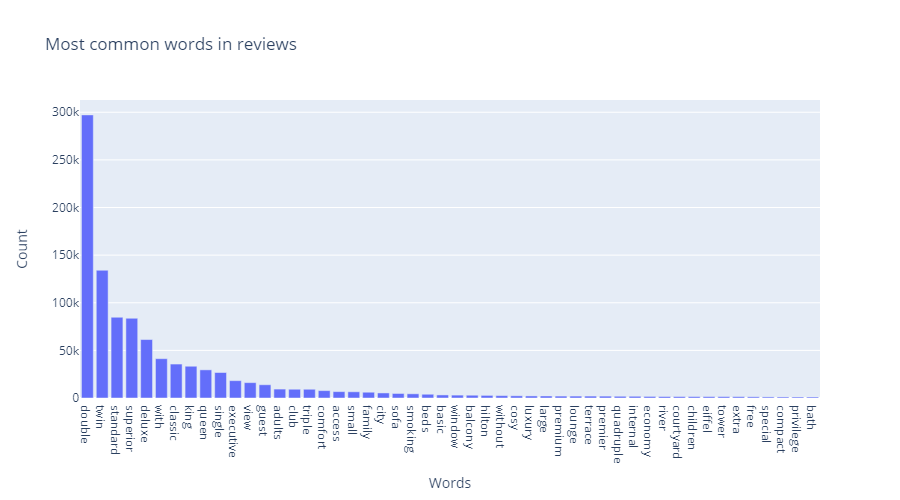

In [78]:
# analysis of room type tags
mask_room = tags_df['tags'].apply(lambda x: True if 'room' in x.split(' ') else False)
find_common(tags_df[mask_room]['tags'].reset_index(), 'tags', exception='room');

In [79]:
# for fast and easy access to tags in feature creation let's join all tags
df['tags'] = df['tags'].apply(lambda x: ' '.join(x))

In [80]:
# creating features with some TOP words 'double', 'twin', 'superior', 'deluxe', ''classic', 'king', 'queen', 'single'
df['double_room'] = df['tags'].apply(lambda x: 1 if ('double' in x.split(' ') 
                                                     or 'twin' in x.split(' '))  else 0)
df['superior_room'] = df['tags'].apply(lambda x: 1 if ('superior' in x.split(' '))  else 0)
df['deluxe_room'] = df['tags'].apply(lambda x: 1 if ('deluxe' in x.split(' '))  else 0)
df['classic_room'] = df['tags'].apply(lambda x: 1 if ('classic' in x.split(' '))  else 0)
df['king_room'] = df['tags'].apply(lambda x: 1 if ('king' in x.split(' '))  else 0)
df['queen_room'] = df['tags'].apply(lambda x: 1 if ('queen' in x.split(' '))  else 0)
df['single_room'] = df['tags'].apply(lambda x: 1 if ('single' in x.split(' '))  else 0)


*** Most common words ***:
 ['family', 'children', 'with', 'young', 'older', 'room', 'adults', 'studio', 'king', 'double', 'suite', 'executive', 'child', 'superior', 'deluxe', 'standard', 'guestroom', 'triple', 'view', 'sofa', 'junior', 'guest', 'city', 'rooms', 'access', 'connecting', 'hilton', 'luxury', 'bedroom', 'quadruple', 'classic', 'beds', 'queen', 'balcony', 'apartment', 'single', 'health', 'nagomi', 'duplex', 'prestige', 'premium', 'free', 'people', 'phone', 'joining', 'mobile', 'connected', 'bathroom', 'cosy', 'annex']


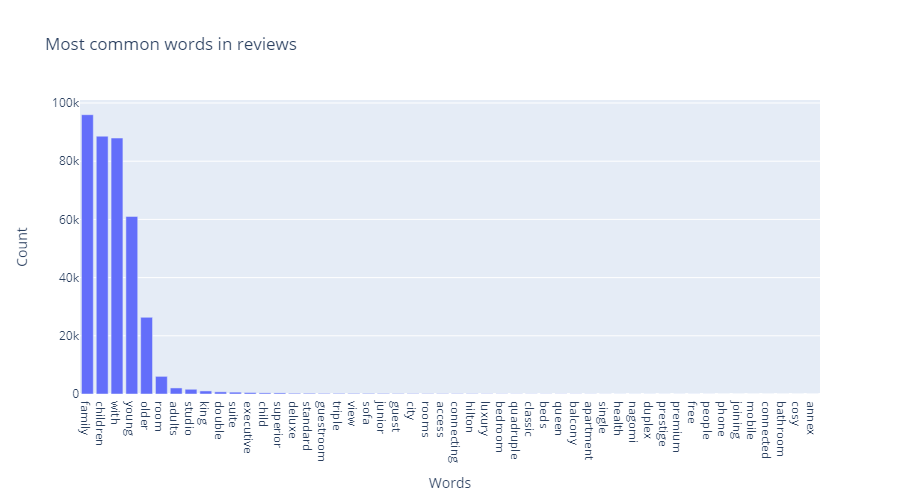

In [81]:
# analysis of family status tags
mask_family = tags_df['tags'].apply(lambda x: True if 'family' in x.split(' ') else False)
find_common(tags_df[mask_family]['tags'].reset_index(), 'tags');

In [82]:
# the most common words are 'family', 'children', 'with', 'young'
young_tags = tags_df['tags'].apply(lambda x: x if 'young' in x.split(' ') else None).to_list()
set(young_tags)

{None, 'family with young children'}

In [83]:
# a small difference in rooms with children or with young children
# suppose all family rooms are for this porpoises
df['family_room'] = df['tags'].apply(lambda x: 1 if ('family' in x.split(' '))  else 0)

## **Feature selection**

**Encoding** 

In [84]:
def cat_encoder(data):
    """
    Encoding features. 
    Using OneHotEncoder if a feature count is between 1 and 16 or
    BinaryEncoder if a feature count is between 16 and 20.

    Args:
        data (DataFrame): DataFrame for encoding.

    Returns:
        data (DataFrame): encoded DataFrame.
    """
    
    for cat in data.select_dtypes(['object']).columns:
        feature_count = data[cat].value_counts().count()
        # print(feature_count, 'categories for feature {}'.format(cat), 
        #     sep=' ', end='\n')
        
        # OneHotEncoder
        if feature_count >2 and feature_count <= 16 :
            print(feature_count, 
                  'categories One Hot Encoded for feature {}'.format(cat), 
                    sep=' ', end='\n')
            
            encoder = ce.OneHotEncoder(cols=[cat], use_cat_names=True)
            type_bin = encoder.fit_transform(data[cat])
            data = pd.concat([data, type_bin], axis=1)
            data = data.drop(cat, axis=1)
            
        # BinaryEncoder                
        elif feature_count > 16 and feature_count < 20:
            print(feature_count,
                  'categories Binary Encoded for feature {}'.format(cat), 
                   sep=' ', end='\n')
            
            encoder = ce.BinaryEncoder(cols=[cat])
            type_bin = encoder.fit_transform(data[cat])
            data = pd.concat([data, type_bin], axis=1)
            data = data.drop(cat, axis=1)
            
        else:
            continue
        
    return data  


# test_enc_df = cat_encoder(df)
df = cat_encoder(df)


6 categories One Hot Encoded for feature country
4 categories One Hot Encoded for feature review_season


In [85]:
# df.to_csv('encoded_hotels.csv', index=False)


**Standardization**

In [86]:
# standardization for  total positive and negative word counts in review with MinMaxScaler

df['review_total_positive_word_counts_stand']  = pd.DataFrame(
    MinMaxScaler().fit_transform(pd.DataFrame(df['review_total_positive_word_counts'])),
    columns=['review_total_positive_word_counts'])

df['review_total_negative_word_counts_stand']  = pd.DataFrame(
    MinMaxScaler().fit_transform(pd.DataFrame(df['review_total_negative_word_counts'])),
    columns=['review_total_negative_word_counts'])

df.drop(
    ['review_total_positive_word_counts_stand', 'review_total_negative_word_counts_stand'], 
    axis=1, inplace=True)


**Final cleaning the dataset from non-informative features**

In [87]:
# creating object and datetime features list
delete_columns = []
delete_columns.extend(df.select_dtypes([object]).columns.to_list())
delete_columns.extend(df.select_dtypes(['datetime64[ns]']).columns.to_list())

# deleting object and datetime features
df.drop(delete_columns, axis = 1, inplace=True)
print('Deleted features:\n{}'.format(delete_columns))

Deleted features:
['hotel_address', 'hotel_name', 'reviewer_nationality', 'negative_review', 'positive_review', 'tags', 'review_date']


In [88]:
# for standart view transforming bool features
bool_features = df.select_dtypes([bool]).columns.to_list()
for b in bool_features:
    df[b] = df[b].apply(int)

In [89]:
# Dropping low information columns 
# with 99% unique values or 99% of identical values.

def low_information(data):
    """
    Function to search low information columns 
    with 99% unique values or 99% of identical values.

    Args:
        data (DataFrame): DataFrame for analysis.

    Returns:
        low_information_cols (list): List of low information columns.
    """
    
    print('*** Searching low information columns ***\n')
        
    low_information_cols = [] 
    
    # searching low information columns
    for col in data.columns:
        top_freq = data[col].value_counts(normalize=True).max()
        nunique_ratio = data[col].nunique() / data[col].count()
        
        if top_freq > 0.99:
            low_information_cols.append(col)
            print(f'{col}: {round(top_freq*100, 2)}% identical values')
        elif nunique_ratio > 0.99:
            low_information_cols.append(col)
            print(f'Dropped: {col} with {round(nunique_ratio*100, 2)}% unique values')
        else:
            continue
        
        if len(low_information_cols) == 0:
            print('No low information columns detected')
    
    return low_information_cols

low_information(df)

*** Searching low information columns ***

duplicated: 99.93% identical values


['duplicated']

In [90]:
# if duplicated entries are only in train dataset we can delete it
# otherwise we would keep it
df[df['duplicated'] == True]['sample'].value_counts()

1    307
0     29
Name: sample, dtype: int64

In [91]:
# unique values for features
df.nunique(dropna=False).sort_values(ascending=False)

negative_review_score                         15776
positive_review_score                          6910
lat                                            1473
lng                                            1473
days_since_review                               731
total_number_of_reviews                         514
additional_number_of_scoring                    480
review_total_negative_word_counts               402
review_total_positive_word_counts               365
total_number_of_reviews_reviewer_has_given      198
reviewer_score                                   38
average_score                                    34
nights                                           32
review_month                                     12
classic_room                                      2
king_room                                         2
queen_room                                        2
single_room                                       2
country_IT                                        2
deluxe_room 

**Correlation**

In [92]:
# quantitative features
num_cols = [
    'total_number_of_reviews', 
    'review_total_negative_word_counts',
    'review_total_positive_word_counts',
    'days_since_review',
    'negative_review_score',
    'positive_review_score']

# categorical features
cat_cols = [
    'additional_number_of_scoring',
    'average_score',
    'lat',
    'lng',
    'duplicated',
    'outliers',
    'capital',
    'city_mil',
    'review_on_weekend',
    'review_month',
    'same_country',
    'no_negative',
    'small_room',
    'no_positive',
    'good_staff',
    'good_location',
    'good_room',
    'good_hotel',
    'very_good',
    'nights',
    'leisure_business_trip',
    'mobile_device',
    'couple_trip',
    'double_room',
    'superior_room',
    'deluxe_room',
    'classic_room',
    'king_room',
    'queen_room',
    'single_room',
    'family_room',
    'country_IT',
    'country_NL',
    'country_ES',
    'country_GB',
    'country_FR',
    'country_AT',
    'review_season_summer',
    'review_season_winter',
    'review_season_autumn',
    'review_season_spring'
    ]

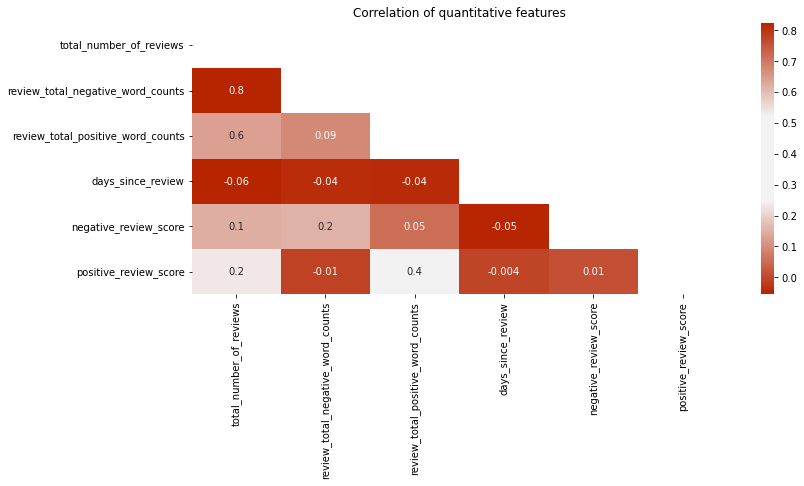

In [93]:
# building a heatmap for quantitative features

fig = plt.figure(figsize=(12, 5))
corr = df[num_cols].corr(method='pearson')
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(15, 15, s=100, l=40, sep=80, as_cmap=True)
heatmap = sns.heatmap(
    corr, 
    cmap=cmap,
    annot=True,
    mask=mask,
    fmt='.1g'
)

heatmap.set_title('Correlation of quantitative features');

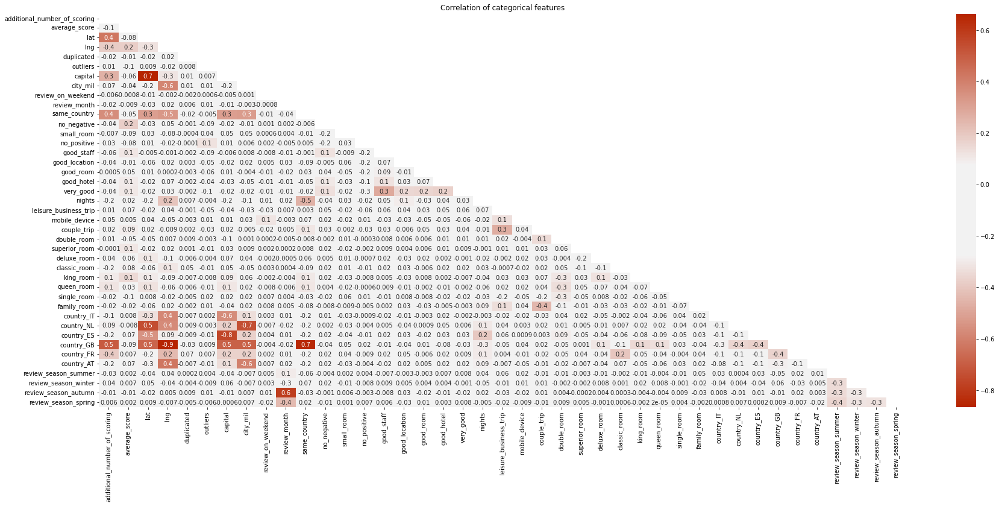

In [94]:
# building a heatmap for categorical features

fig = plt.figure(figsize=(30, 12))
corr = df[cat_cols].corr(method='spearman')
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(15, 15, s=100, l=40, sep=60, as_cmap=True)
heatmap = sns.heatmap(
    corr, 
    cmap=cmap,
    annot=True,
    mask=mask,
    fmt='.1g'
)

heatmap.set_title('Correlation of categorical features');

In [95]:
# deleting features with hight correlation 0,7

df.drop(['lng', 'lat', 'same_country', 'city_mil', 'capital' ], axis = 1, inplace=True)

**Feature importance**

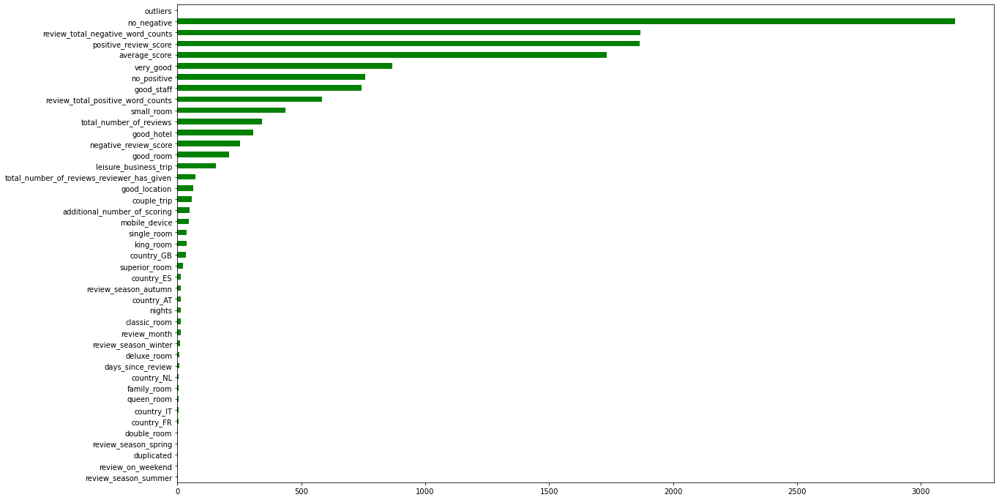

In [96]:

# for categorieswould use Chi quadrate and for quantatives ANOVA:
y = df.query('sample == 1').drop(['sample'], axis=1)['reviewer_score'].values
X = df.query('sample == 1').drop(['sample', 'reviewer_score'], axis=1)

# visualization
imp_num = pd.Series(f_classif(X[X.columns], y)[0], index = X.columns)
imp_num.sort_values(inplace = True)

fig5, ax5 = plt.subplots(figsize=(20, 12))
imp_num.plot(kind = 'barh', color='Green');

# **Model Learning**

In [97]:
# select test part
train_data = df.query('sample == 1').drop(['sample'], axis=1)
test_data = df.query('sample == 0').drop(['sample'], axis=1)

y = train_data.reviewer_score.values            # target
X = train_data.drop(['reviewer_score'], axis=1)

In [98]:
# breakdown of test data, select 20% of the data for validation (parameter test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)

In [99]:
# check
test_data.shape, train_data.shape, X.shape, X_train.shape, X_test.shape

((128935, 44), (386803, 44), (386803, 43), (309442, 43), (77361, 43))

In [100]:
# creating a model
model = RandomForestRegressor(n_estimators=100, verbose=1, n_jobs=-1, random_state=RANDOM_SEED)

In [101]:
# train the model on the test dataset
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  5.8min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    3.1s finished


In [102]:
# comparing (y_pred) and (y_test) inMean Absolute Error (MAE) 
print('MAPE:', metrics.mean_absolute_error(y_test, y_pred))

MAPE: 0.7964683755380616


<AxesSubplot:>

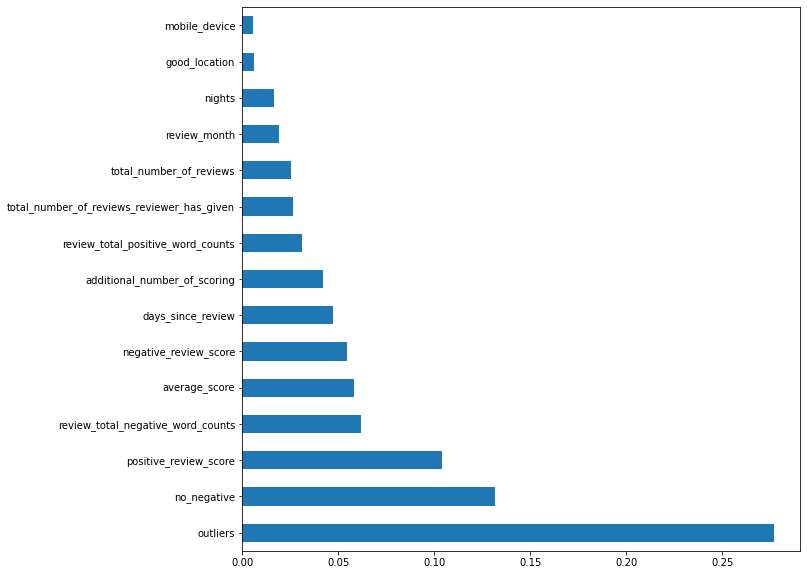

In [103]:
# displaying the most important features for the model
plt.rcParams['figure.figsize'] = (10,10)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')

In [104]:
test_data.sample(10)

,additional_number_of_scoring,average_score,review_total_negative_word_counts,total_number_of_reviews,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,days_since_review,reviewer_score,duplicated,outliers,...,country_IT,country_NL,country_ES,country_GB,country_FR,country_AT,review_season_summer,review_season_winter,review_season_autumn,review_season_spring
69715,1005,8.3,0,69,69,1,72,0.0,0,0,...,0,0,0,1,0,0,0,0,0,1
60836,312,8.5,12,15,3,20,496,0.0,0,0,...,0,0,0,1,0,0,0,0,0,1
58991,371,7.3,61,74,13,1,403,0.0,0,0,...,0,0,0,1,0,0,1,0,0,0
111373,581,8.4,5,10,5,2,471,0.0,0,0,...,0,0,0,1,0,0,0,0,0,1
21999,468,7.7,0,51,51,4,205,0.0,0,0,...,0,0,0,1,0,0,0,1,0,0
48909,393,8.6,0,16,16,4,129,0.0,0,0,...,0,0,1,0,0,0,0,0,0,1
84906,764,8.2,26,32,6,1,117,0.0,0,0,...,0,0,0,1,0,0,0,0,0,1
56348,74,9.2,10,15,5,1,375,0.0,0,0,...,0,0,0,0,1,0,1,0,0,0
31522,457,6.8,51,51,0,1,719,0.0,0,0,...,0,0,0,1,0,0,1,0,0,0
70460,172,8.3,2,4,2,3,76,0.0,0,0,...,0,0,1,0,0,0,0,0,0,1


In [105]:
test_data = test_data.drop(['reviewer_score'], axis=1)

In [106]:
sample_submission

,reviewer_score,id
0,8.793,488440
1,7.406,274649
2,7.992,374688
3,9.663,404352
4,9.639,451596
...,...,...
128930,8.553,495812
128931,9.311,315577
128932,8.206,511968
128933,9.616,303386


In [107]:
predict_submission = model.predict(test_data)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    5.5s finished


In [108]:
predict_submission

array([8.8  , 7.38 , 8.22 , ..., 8.176, 9.62 , 7.246])

In [109]:
list(sample_submission)

['reviewer_score', 'id']

In [110]:
sample_submission['reviewer_score'] = predict_submission
sample_submission.to_csv('submission.csv', index=False)
sample_submission.head(10)

,reviewer_score,id
0,8.800,488440
1,7.380,274649
2,8.220,374688
3,9.675,404352
4,9.662,451596
5,8.152,302161
6,7.628,317079
7,8.593,13963
8,8.853,159785
9,7.755,195089
